In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt
import anndata

In [2]:
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['font.sans-serif'] = 'Arial'
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,facecolor='white')
results_file = 'write/HCC_snRNA.h5ad'
sc.settings.set_figure_params(dpi = 100,dpi_save= 300,figsize = (5,5))

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.7.3 pandas==1.3.5 scikit-learn==0.22 statsmodels==0.13.5 python-igraph==0.10.6 louvain==0.8.1 pynndescent==0.5.10


In [3]:
TB1 = sc.read_10x_mtx('SRR11038989/filtered_feature_bc_matrix/',var_names = 'gene_symbols',cache = True)
TB2 = sc.read_10x_mtx('SRR11038990/filtered_feature_bc_matrix/',var_names = 'gene_symbols',cache = True)
TB3 = sc.read_10x_mtx('SRR11038991/filtered_feature_bc_matrix/',var_names = 'gene_symbols',cache = True)
LTB1 = sc.read_10x_mtx('SRR11038992/filtered_feature_bc_matrix/',var_names = 'gene_symbols',cache = True)
LTB2 = sc.read_10x_mtx('SRR11038993/filtered_feature_bc_matrix/',var_names = 'gene_symbols',cache = True)
Healthy1 = sc.read_10x_mtx('SRR11038994/filtered_feature_bc_matrix/',var_names = 'gene_symbols',cache = True)
Healthy2 = sc.read_10x_mtx('SRR11038995/filtered_feature_bc_matrix/',var_names = 'gene_symbols',cache = True)

... reading from cache file cache\SRR11038989-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\SRR11038990-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\SRR11038991-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\SRR11038992-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\SRR11038993-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\SRR11038994-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\SRR11038995-filtered_feature_bc_matrix-matrix.h5ad


In [4]:
TB1.obs['sample'] = 'TB1'
TB2.obs['sample'] = 'TB2'
TB3.obs['sample'] = 'TB3'
LTB1.obs['sample'] = 'LTB1'
LTB2.obs['sample'] = 'LTB2'
Healthy1.obs['sample'] = 'Healthy1'
Healthy2.obs['sample'] = 'Healthy2'

In [5]:
TB1.obs['Group'] = 'TB'
TB2.obs['Group'] = 'TB'
TB3.obs['Group'] = 'TB'
LTB1.obs['Group'] = 'LTB'
LTB2.obs['Group'] = 'LTB'
Healthy1.obs['Group'] = 'Healthy'
Healthy2.obs['Group'] = 'Healthy'

In [6]:
adList = [TB1,TB2,TB3,LTB1,LTB2,Healthy1,Healthy2]

In [7]:
adata = sc.AnnData.concatenate(*adList,join = 'outer')

c:\soft\python-3.7.3\lib\site-packages\anndata\_core\anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


normalizing counts per cell
    finished (0:00:00)


meta NOT subset; don't know how to subset; dropped


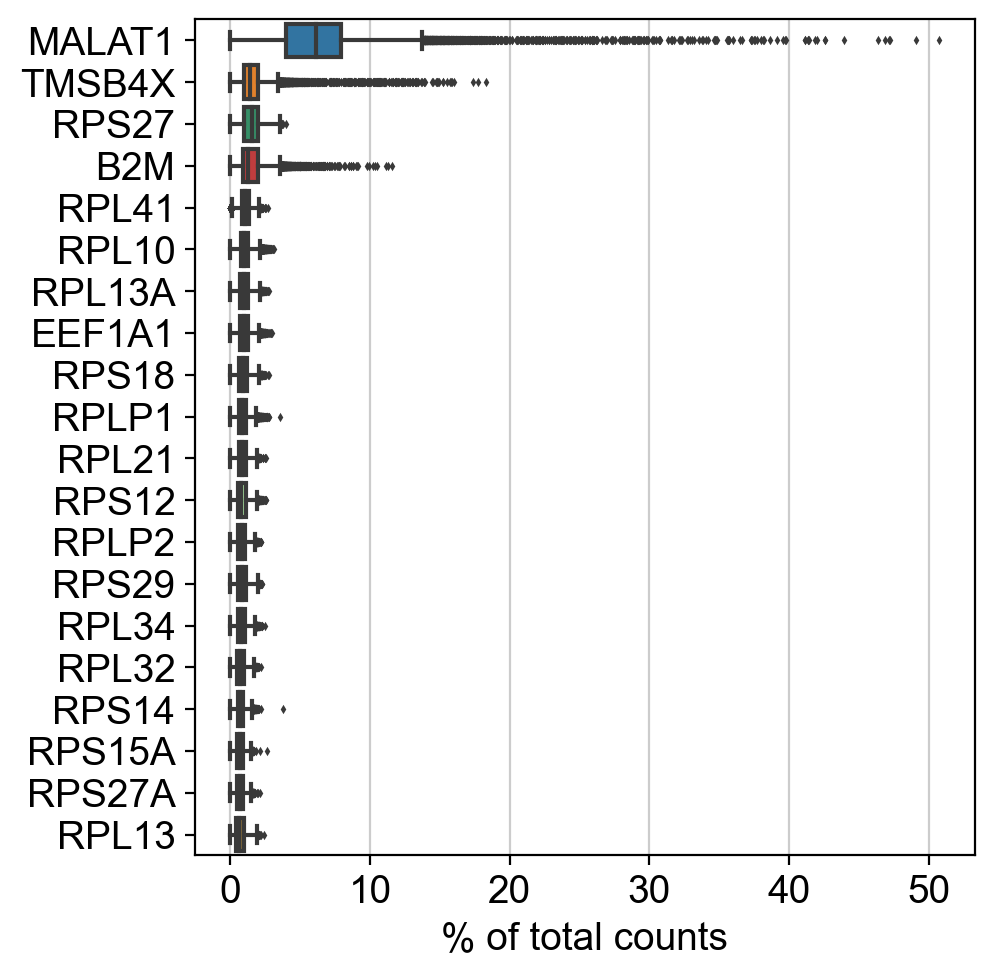

In [8]:
sc.pl.highest_expr_genes(adata,n_top = 20,save='.scrna.TB.pdf')

In [9]:
sc.pp.filter_cells(adata,min_genes = 200)
sc.pp.filter_genes(adata,min_cells = 3)

filtered out 186 cells that have less than 200 genes expressed
filtered out 13373 genes that are detected in less than 3 cells


In [10]:
adata

AnnData object with n_obs × n_vars = 69723 × 23228
    obs: 'sample', 'Group', 'batch', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

meta NOT subset; don't know how to subset; dropped


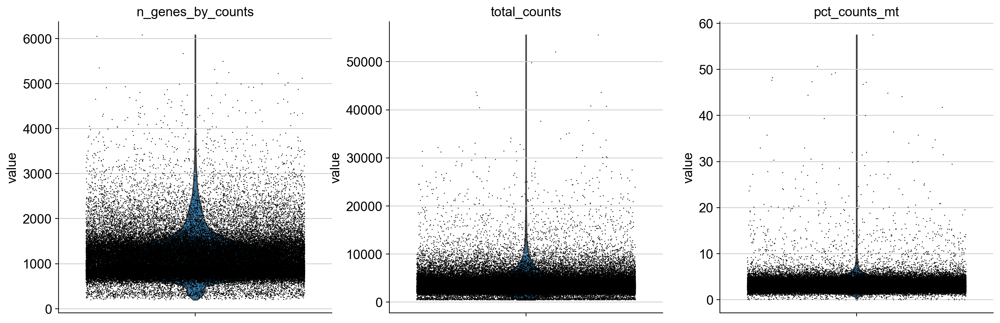

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata,qc_vars = ['mt'],percent_top = None,log1p = False,inplace = True)
sc.pl.violin(adata,['n_genes_by_counts','total_counts','pct_counts_mt'],jitter = 0.4
             ,multi_panel = True,save = ".counts.scRNA.TB.pdf")

In [12]:
adata = adata[adata.obs.pct_counts_mt < 10, :]
adata = adata[adata.obs.n_genes_by_counts < 6000, :]

In [13]:
adata.write_h5ad('adata_raw.h5ad')

In [14]:
sc.pp.normalize_total(adata,target_sum = 1e4)
sc.pp.log1p(adata)

c:\soft\python-3.7.3\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [15]:
adata.raw = adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


meta NOT subset; don't know how to subset; dropped


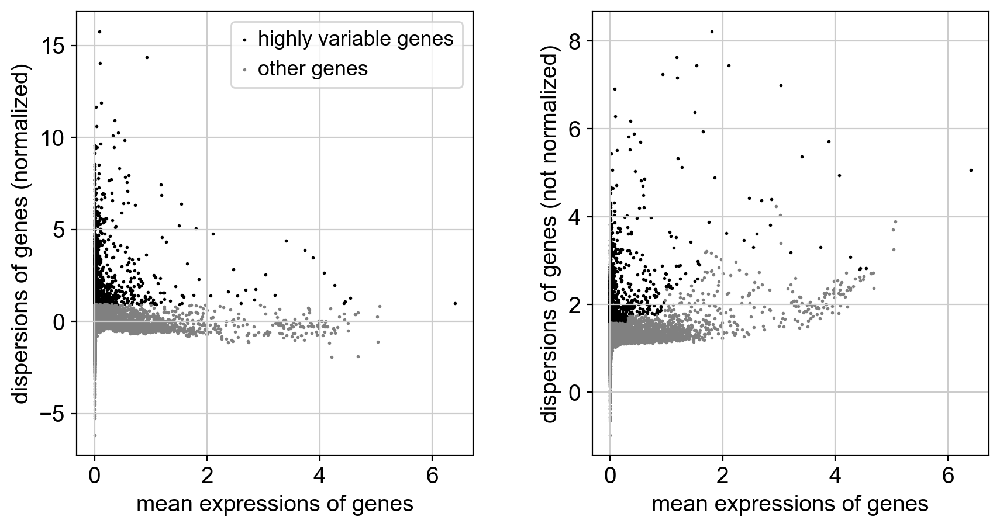

In [16]:
sc.pp.highly_variable_genes(adata,min_mean = 0.0125,max_mean = 3,min_disp = 0.5,n_top_genes = 2000)
sc.pl.highly_variable_genes(adata,save = '.scRNA.TB.pdf')

In [17]:
adata = adata[:,adata.var.highly_variable]
sc.pp.regress_out(adata,['total_counts'])
sc.pp.scale(adata,max_value = 10)

regressing out ['total_counts']
    sparse input is densified and may lead to high memory use
    finished (0:01:22)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:12)


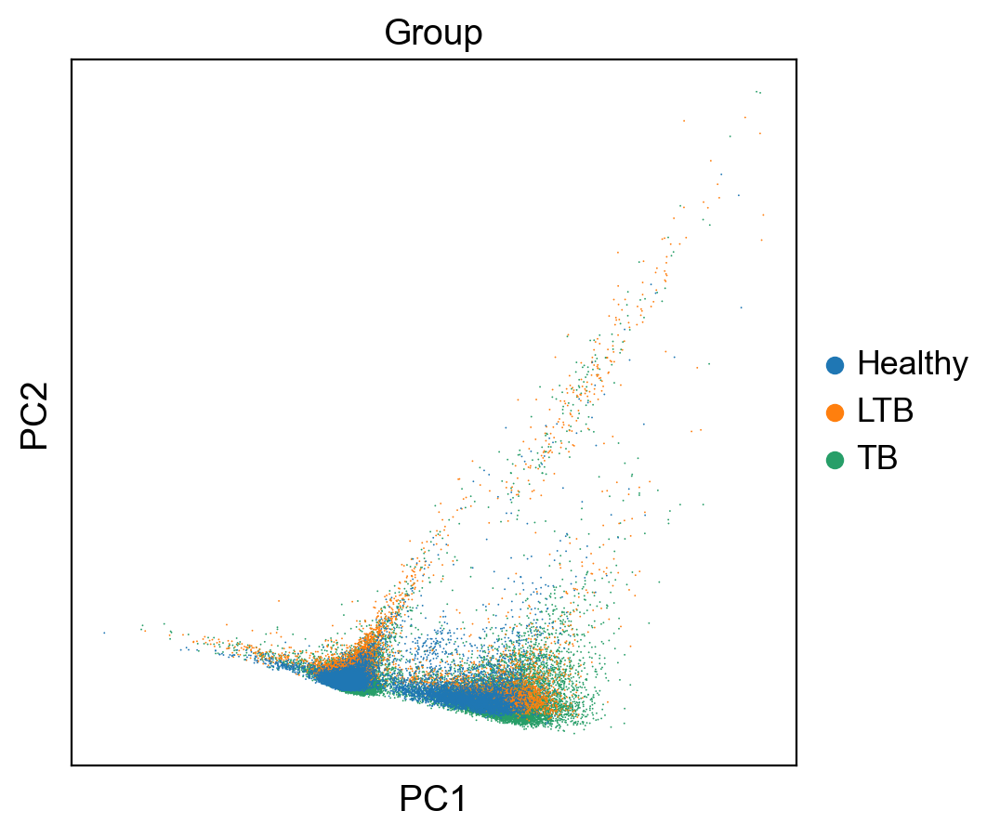

In [18]:
sc.tl.pca(adata,svd_solver = 'arpack')
sc.pl.pca(adata,color = 'Group')

In [19]:
sc.pp.neighbors(adata,n_neighbors = 10,n_pcs = 40)
sc.tl.tsne(adata)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:26)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:11:36)


meta NOT subset; don't know how to subset; dropped


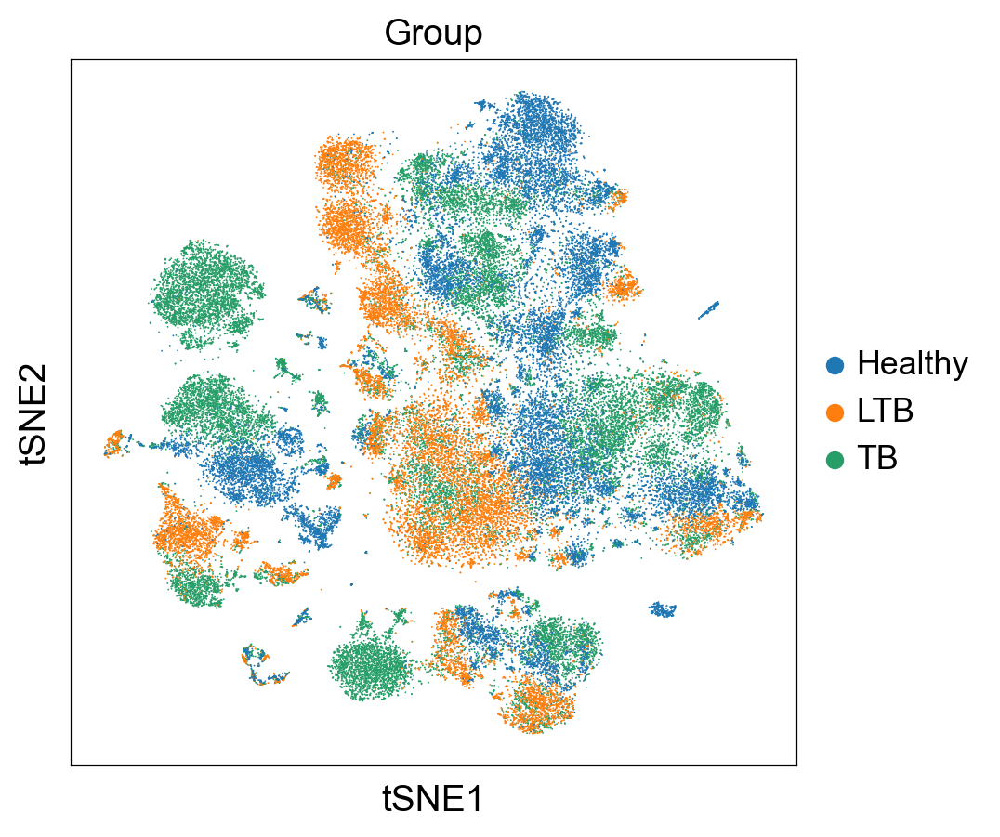

In [20]:
sc.pl.tsne(adata,color = ['Group'],save = '.cluster.scRNA.TB.pdf')

running Leiden clustering
    finished: found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)


meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


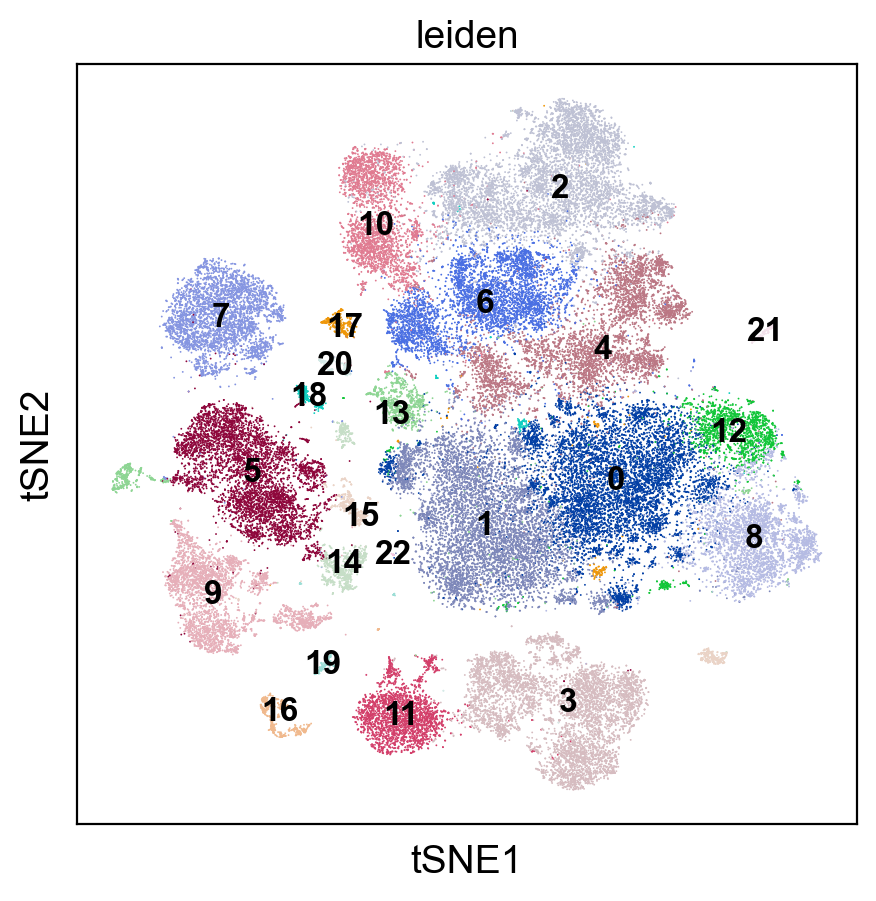

meta NOT subset; don't know how to subset; dropped


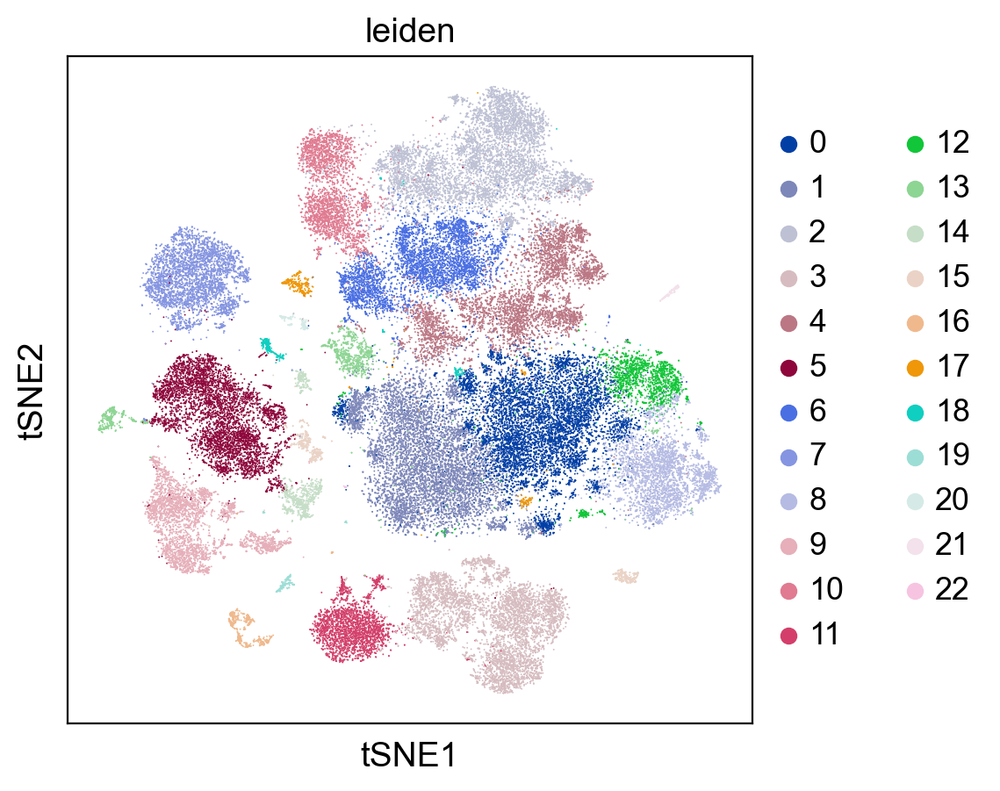

In [28]:
sc.tl.leiden(adata,resolution = 0.6)
sc.pl.tsne(adata,color = ['leiden'],legend_loc='on data',legend_fontsize=12,save = '.cluster.ondata.tsne.scRNA.pdf')
sc.pl.tsne(adata,color = ['leiden'],save = '.cluster.tsne.scRNA.pdf')

meta NOT subset; don't know how to subset; dropped


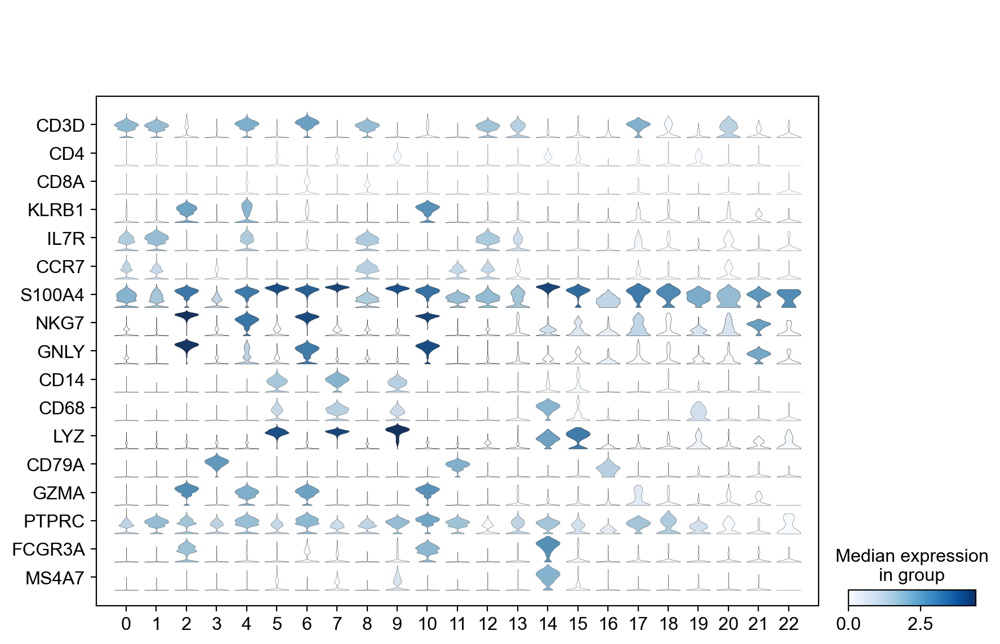

In [26]:
marker_genes = ['CD3D', 'CD4','CD8A','KLRB1','IL7R','CCR7','S100A4','NKG7','GNLY','CD14','CD68','LYZ','CD79A','GZMA','PTPRC','FCGR3A','MS4A7']
sc.pl.stacked_violin(adata, marker_genes,swap_axes=True, groupby='leiden',save = 'cluster.maker.em.pdf')#rotation=90

In [29]:
sc.tl.rank_genes_groups(adata,'leiden',method = 'wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:08)


c:\soft\python-3.7.3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
c:\soft\python-3.7.3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
c:\soft\python-3.7.3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

In [30]:
#dict_keys(['logfoldchanges', 'names', 'params', 'pvals', 'pvals_adj', 'scores'])
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(    {group + '_' + key[:1]: result[key][group]    for group in groups for key in ['names', 'pvals']}).head(5)
res = pd.DataFrame(    {group + '_' + key: result[key][group]    for group in groups for key in ['names', 'pvals','logfoldchanges','pvals_adj','scores']})
res.to_csv("dif.csv") #基因差异情况输出到本地保存

In [31]:
adata.obs['cell'] = adata.obs_names
adata.obs.to_csv('adata.obs.xls', index=0, sep='\t')

In [32]:
adata.write_h5ad('adata_result.h5ad')

In [3]:
adata = sc.read_h5ad('adata_result.h5ad')

In [4]:
metadata = pd.read_csv('adata.obs.csv')
adata.obs['Celltype'] = pd.DataFrame(metadata,columns=['Celltype']).values

meta NOT subset; don't know how to subset; dropped


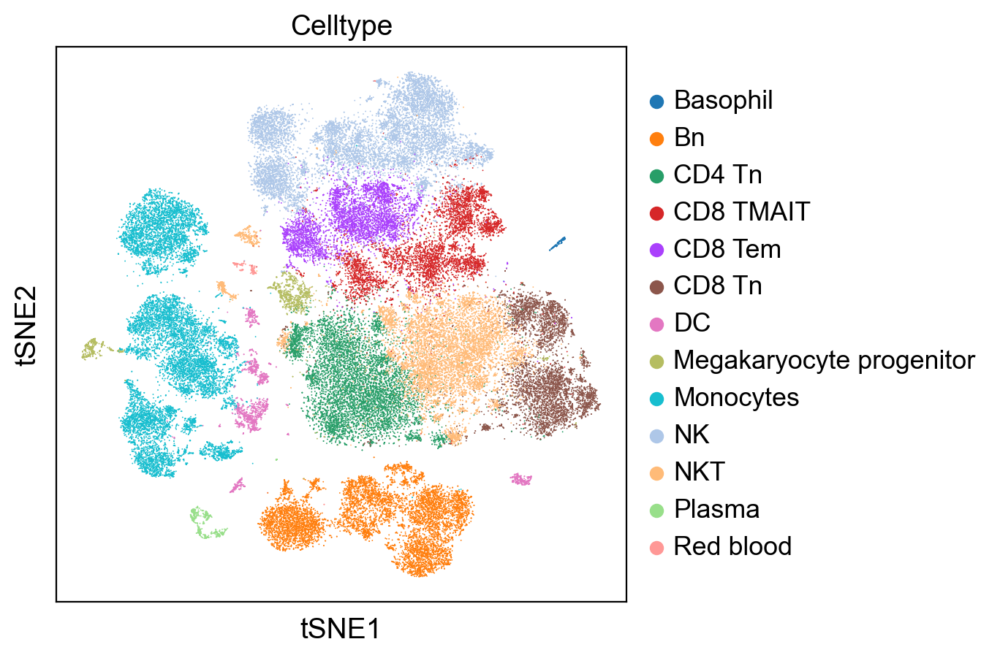

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


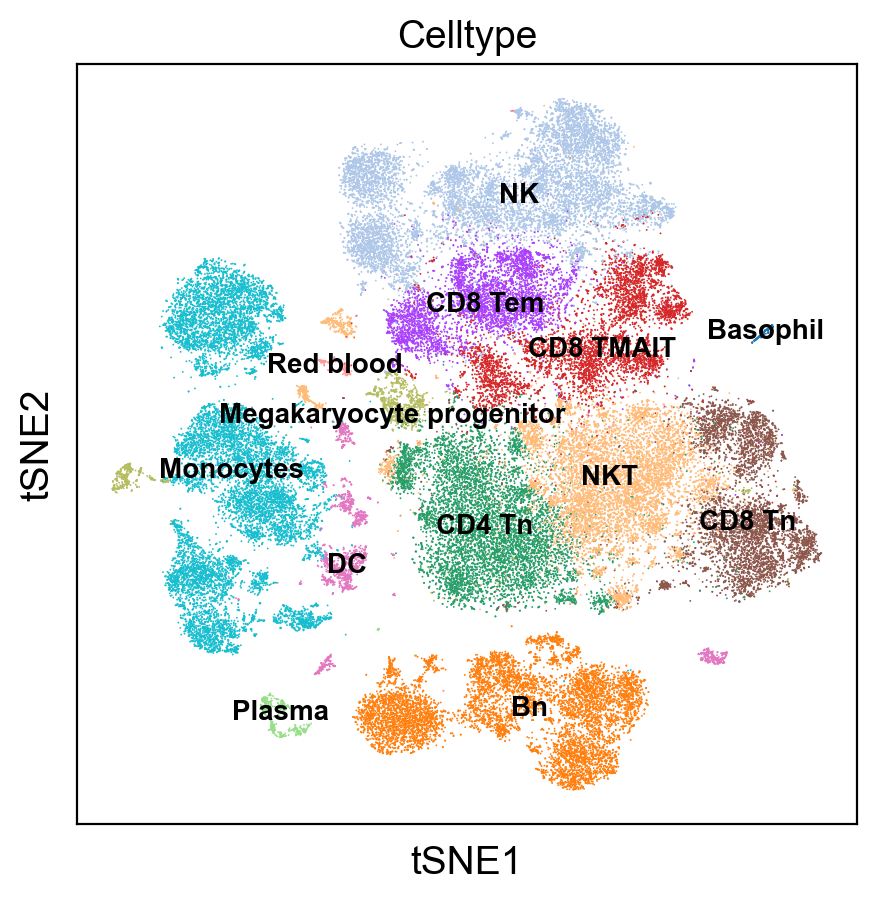

In [5]:
sc.pl.tsne(adata, color=['Celltype'],save = '.umap.Celltype.pdf')
sc.pl.tsne(adata, color=['Celltype'],legend_loc='on data',legend_fontsize=10,save = '.umap.Celltype2.pdf')

meta NOT subset; don't know how to subset; dropped


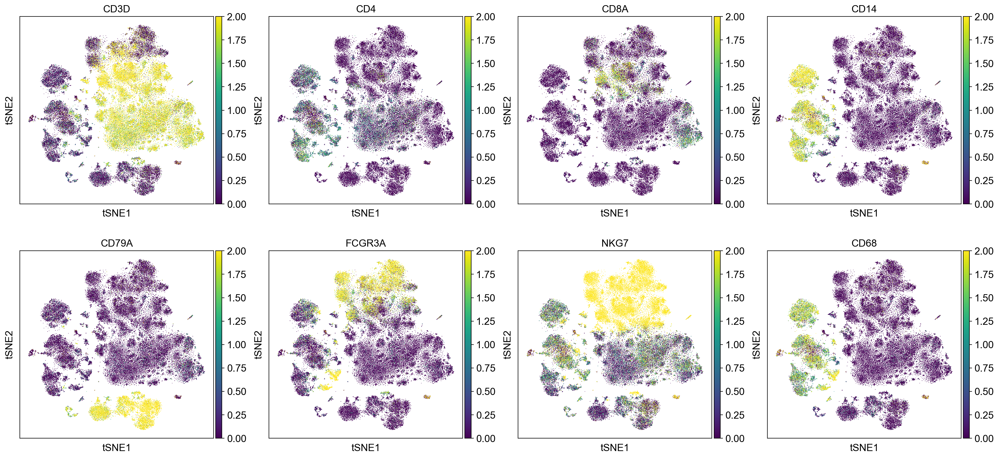

In [8]:
sc.pl.tsne(adata,color = ['CD3D','CD4','CD8A','CD14','CD79A','FCGR3A','NKG7','CD68'],save = '.cluster.maker2.pdf',vmax=2)

In [9]:
import datatable as dt

In [15]:
maker = adata.raw.var_names
data = adata.raw[:,maker]

In [16]:
X=pd.DataFrame(data.X.toarray().T,columns=data.obs_names)
Symbol=dt.Frame({'Symbol':data.var_names.values})
X = dt.cbind([Symbol,dt.Frame(X)])
X.to_csv('matrix_X.csv') # 使用datatable加速导出

In [18]:
data

In [ ]:
adata.var.to_csv('adata.var.xls', index=0, sep='\t')